In [1]:
# import all necessary libraries 
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# from sklearn.cluster import DBSCAN

In [2]:
pwd

'C:\\Users\\ABDUL FATAI\\Downloads\\Ellah\\Oghenekaro_Emmanuella'

<h2>Load the dataset</h2>

In [3]:
rawData = pd.read_excel('DataSet/geoPoll.xlsx')

In [4]:
rawData.head()

,Gender.Weights,Age Group.Weights,ADM1.Weights,Total Weights,Survey Date,Country,Gender,Age Group,Admin1,SEC,...,InformationSources: Friends/family,InformationSources: Government messages,InformationSources: Newspapers,InformationSources: Other,InformationSources: Radio,InformationSources: Social Media,InformationSources: TV,SocialMedia,MediaConsumption,StayPositive
0,0.921659,1.090933,1.034665,1.040323,2020-04-02,Kenya,Male,15-25,Machakos,B,...,False,True,False,False,False,False,False,NaN,Consuming more,Nothing
1,0.921659,0.894454,1.029298,0.848534,2020-04-02,Kenya,Male,26-35,Uasin Gishu,C1,...,False,True,False,False,False,True,True,Media outlets,Consuming more,Hope
2,0.970297,1.034483,0.800000,0.803004,2020-04-02,Nigeria,Male,15-25,Benue,A,...,False,False,False,False,False,True,False,Health organizations,Consuming more,Will go back to school soon
3,0.921659,0.894454,0.994802,0.820096,2020-04-02,Kenya,Male,26-35,Kisii,C1,...,False,True,True,False,True,True,True,Health organizations,Consuming more,the covid 19 outbreak has not been confirmed i...
4,0.921659,1.090933,0.975088,0.980420,2020-04-02,Kenya,Male,15-25,Nandi,B,...,False,False,False,False,False,True,False,Media outlets,Consuming less,talking to peaple and watching movies playing...


In [5]:
# to get the shape of the dataset
rawData.shape

(3988, 62)

In [6]:
# get information from the ReadAdultData
print('Information from the rawData\n')
rawData.info()

Information from the rawData

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3988 entries, 0 to 3987
Data columns (total 62 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   Gender.Weights                                   3988 non-null   float64       
 1   Age Group.Weights                                3988 non-null   float64       
 2   ADM1.Weights                                     3988 non-null   float64       
 3   Total Weights                                    3988 non-null   float64       
 4   Survey Date                                      3988 non-null   datetime64[ns]
 5   Country                                          3988 non-null   object        
 6   Gender                                           3988 non-null   object        
 7   Age Group                                        3988 non-null   object        
 8   Admin1  

<h2>To check if the dataset needs to be Preprocessed</h2>

In [7]:
# to detect if there are missing values and sum up the missing values.
rawData.isnull().sum()

Gender.Weights                         0
Age Group.Weights                      0
ADM1.Weights                           0
Total Weights                          0
Survey Date                            0
                                    ... 
InformationSources: Social Media       0
InformationSources: TV                 0
SocialMedia                         2364
MediaConsumption                       0
StayPositive                        1989
Length: 62, dtype: int64

<h2>To check for missing values</h2>

In [8]:
def missing_values_table(rawData):
        # Total missing values
        mis_rawData = rawData.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * rawData.isnull().sum() / len(rawData)
        
        # Make a table with the results
        mis_val_table = pd.concat([ mis_rawData , mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(rawData.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns
    
missingValues = missing_values_table(rawData)
print(missingValues)

Your selected dataframe has 62 columns.
There are 5 columns that have missing values.
                  Missing Values  % of Total Values
SocialMedia                 2364               59.3
StayPositive                1989               49.9
BiggestChallenge            1988               49.8
FoodLocations2              1927               48.3
BrandPurchase                808               20.3


<h3>The above code shows that there are missing values in some columns</h3>
<br>

In [9]:
# create a count column to later check for outliers
rawData['count'] = rawData.index

<h3>Check for mismatched data type</h3>

In [10]:
n = 0
colNo = 0 
while colNo < len(rawData.columns):
    print(rawData.columns[colNo])
    print("-----------------------------------------------------------------------------")
    for (rowName, data) in rawData.iterrows():
        if type(data[n]) == float:
            print(str(True) + ", This value has a data type of float: " + str(data[n]))
        elif type(data[n]) == str:
            print(str(True) + ", This value has a data type of string: " + str(data[n]))
        elif type(data[n]) == bool:
            print(str(True) + ", This value has a data type of boolean: " + str(data[n]))
        elif type(data[n]) == int:
            print(str(True) + ", This value has a data type of integer: " + str(data[n]))
        else:
            print("This value has a data type that does not exist: " + str(data[n]))
    n = n + 1
    print("------------------------------------------------------------------------------\n\n")
    colNo = colNo + 1

Gender.Weights
-----------------------------------------------------------------------------
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9702970297029703
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 1.0928961748633879
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 0.9216589861751152
True, This value has a data type of float: 1.0303030303030303
True, This value has a data type of flo

True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This va

True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.1111111111111112
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.049164937347865
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.9892456521990942
True, This value has a data type of float: 1.0339963662872953
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0666666666666667
True, This value has a data type 

True, This value has a data type of float: 1.00375554796859
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.6339508724012147
True, This value has a data type of float: 3.615835981210242
True, This value has a data type of float: 1.013743165361312
True, This value has a data type of float: 0.9528745750055532
True, This value has a data type of float: 1.029716840485504
True, This value has a data type of float: 1.013743165361312
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.0
True, This value has a data type of float: 1.1263812948459022
True, This value has a data type of float: 1.0
True, This value has a data type of float: 0.28077179246956546
True, This value has a data type of float: 1.0
True, This value has a d

This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 2020-04-02 00:00:00
This value has a data type that does not exist: 

This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 2020-04-06 00:00:00
This value has a data type that does not exist: 

True, This value has a data type of string: South Africa
True, This value has a data type of string: Ghana
True, This value has a data type of string: South Africa
True, This value has a data type of string: Zambia
True, This value has a data type of string: Mozambique
True, This value has a data type of string: South Africa
True, This value has a data type of string: South Africa
True, This value has a data type of string: Benin
True, This value has a data type of string: Mozambique
True, This value has a data type of string: South Africa
True, This value has a data type of string: Zambia
True, This value has a data type of string: Ghana
True, This value has a data type of string: Ghana
True, This value has a data type of string: South Africa
True, This value has a data type of string: South Africa
True, This value has a data type of string: Benin
True, This value has a data type of string: Ghana
True, This value has a data type of string: Nigeria
True, This value has a data type of s

True, This value has a data type of string: Female
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Female
True, This value has a data type of string: Female
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Female
True, This value has a data type of string: Female
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Male
True, This value has a data type of string: Female
True, Th

True, This value has a data type of string: 26-35
True, This value has a data type of string: 26-35
True, This value has a data type of string: 15-25
True, This value has a data type of string: 26-35
True, This value has a data type of string: 26-35
True, This value has a data type of string: 15-25
True, This value has a data type of string: 36+
True, This value has a data type of string: 26-35
True, This value has a data type of string: 26-35
True, This value has a data type of string: 26-35
True, This value has a data type of string: 26-35
True, This value has a data type of string: 36+
True, This value has a data type of string: 36+
True, This value has a data type of string: 36+
True, This value has a data type of string: 26-35
True, This value has a data type of string: 26-35
True, This value has a data type of string: 26-35
True, This value has a data type of string: 26-35
True, This value has a data type of string: 36+
True, This value has a data type of string: 36+
True, This v

True, This value has a data type of string: Homa Bay
True, This value has a data type of string: Zanzan
True, This value has a data type of string: Lacs
True, This value has a data type of string: Littoral
True, This value has a data type of string: Bas-Sassandra
True, This value has a data type of string: Abidjan
True, This value has a data type of string: Savanes
True, This value has a data type of string: Sassandra-Marahoué
True, This value has a data type of string: Montagnes
True, This value has a data type of string: Limpopo
True, This value has a data type of string: Eastern Cape
True, This value has a data type of string: Bayelsa
True, This value has a data type of string: Abidjan
True, This value has a data type of string: Abidjan
True, This value has a data type of string: Brong Ahafo
True, This value has a data type of string: Lusaka
True, This value has a data type of string: Gauteng
True, This value has a data type of string: Limpopo
True, This value has a data type of str

True, This value has a data type of string: B
True, This value has a data type of string: A
True, This value has a data type of string: C1
True, This value has a data type of string: C1
True, This value has a data type of string: B
True, This value has a data type of string: C1
True, This value has a data type of string: A
True, This value has a data type of string: B
True, This value has a data type of string: D
True, This value has a data type of string: A
True, This value has a data type of string: A
True, This value has a data type of string: C1
True, This value has a data type of string: B
True, This value has a data type of string: C1
True, This value has a data type of string: C1
True, This value has a data type of string: C1
True, This value has a data type of string: C2
True, This value has a data type of string: C1
True, This value has a data type of string: D
True, This value has a data type of string: C1
True, This value has a data type of string: C1
True, This value has a 

True, This value has a data type of integer: 28
True, This value has a data type of integer: 26
True, This value has a data type of integer: 22
True, This value has a data type of integer: 34
True, This value has a data type of integer: 25
True, This value has a data type of integer: 22
True, This value has a data type of integer: 20
True, This value has a data type of integer: 38
True, This value has a data type of integer: 39
True, This value has a data type of integer: 26
True, This value has a data type of integer: 22
True, This value has a data type of integer: 41
True, This value has a data type of integer: 33
True, This value has a data type of integer: 25
True, This value has a data type of integer: 23
True, This value has a data type of integer: 30
True, This value has a data type of integer: 25
True, This value has a data type of integer: 37
True, This value has a data type of integer: 30
True, This value has a data type of integer: 53
True, This value has a data type of inte

True, This value has a data type of integer: 1999
True, This value has a data type of integer: 1991
True, This value has a data type of integer: 1999
True, This value has a data type of integer: 1987
True, This value has a data type of integer: 1994
True, This value has a data type of integer: 1993
True, This value has a data type of integer: 1998
True, This value has a data type of integer: 1987
True, This value has a data type of integer: 1983
True, This value has a data type of integer: 1996
True, This value has a data type of integer: 1986
True, This value has a data type of integer: 1989
True, This value has a data type of integer: 1994
True, This value has a data type of integer: 1980
True, This value has a data type of integer: 1996
True, This value has a data type of integer: 1988
True, This value has a data type of integer: 1990
True, This value has a data type of integer: 1993
True, This value has a data type of integer: 1999
True, This value has a data type of integer: 1986


True, This value has a data type of integer: 1995
True, This value has a data type of integer: 1998
True, This value has a data type of integer: 1992
True, This value has a data type of integer: 1994
True, This value has a data type of integer: 1998
True, This value has a data type of integer: 1995
True, This value has a data type of integer: 1996
True, This value has a data type of integer: 1998
True, This value has a data type of integer: 1983
True, This value has a data type of integer: 1996
True, This value has a data type of integer: 1961
True, This value has a data type of integer: 1995
True, This value has a data type of integer: 1982
True, This value has a data type of integer: 1982
True, This value has a data type of integer: 1976
True, This value has a data type of integer: 1996
True, This value has a data type of integer: 1987
True, This value has a data type of integer: 1956
True, This value has a data type of integer: 1998
True, This value has a data type of integer: 1999


True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of stri

True, This value has a data type of string: Urban area
True, This value has a data type of string: Urban area
True, This value has a data type of string: Urban area
True, This value has a data type of string: Urban area
True, This value has a data type of string: Urban area
True, This value has a data type of string: Rural area
True, This value has a data type of string: Urban area
True, This value has a data type of string: Urban area
True, This value has a data type of string: Urban area
True, This value has a data type of string: Urban area
True, This value has a data type of string: Rural area
True, This value has a data type of string: Rural area
True, This value has a data type of string: Urban area
True, This value has a data type of string: Urban area
True, This value has a data type of string: Urban area
True, This value has a data type of string: Urban area
True, This value has a data type of string: Urban area
True, This value has a data type of string: Urban area
True, This

True, This value has a data type of float: nan
True, This value has a data type of string: Getting money to buy food
True, This value has a data type of string: Covid 19
True, This value has a data type of string: Staying at home
True, This value has a data type of float: nan
True, This value has a data type of string: Bad road connection
True, This value has a data type of string: Coronavirus
True, This value has a data type of string: Financial support
True, This value has a data type of string: Quarantine
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Lack of job
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Hunger
True, This value has a data type of string: In fact l find it difficult to feed myself because of Lock down
True, This value has a data type of 

True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 3
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 1
True, This value has a data type of integer: 4
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 1
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This va

True, This value has a data type of string: Global infections
True, This value has a data type of string: Other
True, This value has a data type of string: Local infections
True, This value has a data type of string: Economic impact
True, This value has a data type of string: Contracting the disease
True, This value has a data type of string: Global infections
True, This value has a data type of string: Economic impact
True, This value has a data type of string: Contracting the disease
True, This value has a data type of string: Economic impact
True, This value has a data type of string: Global infections
True, This value has a data type of string: Economic impact
True, This value has a data type of string: Economic impact
True, This value has a data type of string: Economic impact
True, This value has a data type of string: Global infections
True, This value has a data type of string: Economic impact
True, This value has a data type of string: Travel restrictions
True, This value has 

True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Y

True, This value has a data type of string: No
True, This value has a data type of string: Not sure
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Not sure
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Yes - tested negative
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Yes - tested positive
True, This value has a data type of string: No
True, This value has a data type of string: Yes - tested negative
True, This value has a data type of string: No
True, This value has a data type of st

True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of strin

True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of strin

True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boo

True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolea

True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boole

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data typ

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of

True, This value has a data type of string: 3-5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: 3-5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: More than 5 times
True, This value has a data type of string: 1-2 times
True, This value has a data type of string: 3-5 times
True, This value has a data type of string: 3-5 times
True, This value has a data type of string: 3-5 times
True, This value has a data type of string: 3-5 times
True, This value has a data type of string: 0 times
True, This value has a data type of string: More than 5 times
True, This v

True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string:

True, This value has a data type of string: Not sure
True, This value has a data type of string: Go to doctor
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to doctor
True, This value has a data type of string: Stay home
True, This value has a data type of string: Go to doctor
True, This value has a data type of string: Go to doctor
True, This value has a data type of string: Go to doctor
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to hospital
True, This value has a data type of string: Go to doctor
True, This value has a data type of string: Stay home
True, This value has a data type of string: Go to doctor
True, This value has a data

True, This value has a data type of integer: 3
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 4
True, This value has a data type of integer: 1
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 4
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 4
True, This va

True, This value has a data type of integer: 5
True, This value has a data type of integer: 2
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 1
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 2
True, This value has a data type of integer: 4
True, This value has a data type of integer: 4
True, This value has a data type of integer: 5
True, This va

True, This value has a data type of string: Most are open
True, This value has a data type of string: Most are closed
True, This value has a data type of string: All are open
True, This value has a data type of string: Some are open
True, This value has a data type of string: Some are open
True, This value has a data type of string: Most are closed
True, This value has a data type of string: Most are open
True, This value has a data type of string: All are open
True, This value has a data type of string: All are closed
True, This value has a data type of string: All are open
True, This value has a data type of string: Most are closed
True, This value has a data type of string: Some are open
True, This value has a data type of string: All are open
True, This value has a data type of string: Most are open
True, This value has a data type of string: Some are open
True, This value has a data type of string: Some are open
True, This value has a data type of string: Most are open
True, This 

True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: No
True, This value has a data type of string: Yes
Tr

True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Supermarkets
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Hypermarkets
True, This value has a data type of float: nan
True, This value has a data type of string: Wholesalers
True, This value has a data type of string: Wholesalers
True, This value has a data type of string: Hypermarkets
True, This value has a data type of string: Wholesalers
True, This value has a data type of string: Wholesalers
True, This value has a data type of string: Hypermarkets
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Discounters
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a

True, This value has a data type of string: Less often than usual
True, This value has a data type of string: Same as usual [no change]
True, This value has a data type of string: Less often than usual
True, This value has a data type of string: Less often than usual
True, This value has a data type of string: More often than usual
True, This value has a data type of string: Less often than usual
True, This value has a data type of string: More often than usual
True, This value has a data type of string: Less often than usual
True, This value has a data type of string: More often than usual
True, This value has a data type of string: Less often than usual
True, This value has a data type of string: Same as usual [no change]
True, This value has a data type of string: Same as usual [no change]
True, This value has a data type of string: Same as usual [no change]
True, This value has a data type of string: More often than usual
True, This value has a data type of string: Less often than 

True, This value has a data type of string: Same as usual
True, This value has a data type of string: Bigger packsize than usual
True, This value has a data type of string: Same as usual
True, This value has a data type of string: Smaller packsize than usual
True, This value has a data type of string: Bigger packsize than usual
True, This value has a data type of string: Smaller packsize than usual
True, This value has a data type of string: Bigger packsize than usual
True, This value has a data type of string: Same as usual
True, This value has a data type of string: Same as usual
True, This value has a data type of string: Same as usual
True, This value has a data type of string: Smaller packsize than usual
True, This value has a data type of string: Smaller packsize than usual
True, This value has a data type of string: Same as usual
True, This value has a data type of string: Same as usual
True, This value has a data type of string: Bigger packsize than usual
True, This value has a

True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: No
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of string: Yes
True, This value has a data type of strin

True, This value has a data type of string: Switch to an alterative brand because it is cheaper
True, This value has a data type of string: Switch to an alterative brand because it is cheaper
True, This value has a data type of float: nan
True, This value has a data type of string: Purchase your usual brand
True, This value has a data type of string: Switch to an alterative brand because it is cheaper
True, This value has a data type of string: Purchase your usual brand
True, This value has a data type of string: Purchase your usual brand
True, This value has a data type of string: Switch to an alterative brand because it is cheaper
True, This value has a data type of string: Switch to an alterative brand because it is cheaper
True, This value has a data type of string: Purchase your usual brand
True, This value has a data type of float: nan
True, This value has a data type of string: Switch to an alterative brand because it is cheaper
True, This value has a data type of string: Switch

True, This value has a data type of string: Increased
True, This value has a data type of string: Increased
True, This value has a data type of string: Increased
True, This value has a data type of string: Increased
True, This value has a data type of string: Increased
True, This value has a data type of string: Decreased
True, This value has a data type of string: No change
True, This value has a data type of string: Decreased
True, This value has a data type of string: Decreased
True, This value has a data type of string: No change
True, This value has a data type of string: No change
True, This value has a data type of string: Decreased
True, This value has a data type of string: Decreased
True, This value has a data type of string: Increased
True, This value has a data type of string: Decreased
True, This value has a data type of string: Decreased
True, This value has a data type of string: Decreased
True, This value has a data type of string: No change
True, This value has a data 

True, This value has a data type of integer: 3
True, This value has a data type of integer: 5
True, This value has a data type of integer: 4
True, This value has a data type of integer: 1
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 1
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 1
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 1
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This value has a data type of integer: 3
True, This value has a data type of integer: 5
True, This value has a data type of integer: 5
True, This va

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of b

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type 

True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type o

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type 

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data typ

True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolea

True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of bool

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of

True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type o

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type 

True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of b

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boole

True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True

True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: 

True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean

True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data typ

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type 

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of b

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type 

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of b

True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: True
True, This value has a data type of boolean:

True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type of boolean: True
True, This value has a data type of boolean: False
True, This value has a data type of boolean: False
True, This value has a data type 

True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This va

True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming more
True, This value has a data type of string: No change
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming more
True, This value has a data type of string: No change
True, This value has a data type of string: Consuming more
True, This value has a data type of string: No change
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming more
True, This value has a data type of string: Consuming more
True, This v

True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Tv
True, This value has a data type of string: Home fitness
True, This value has a data type of float: nan
True, This value has a data type of string: Quarantin
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Family and friends
True, This value has a data type of float: nan
True, This value has a data type of float: nan
True, This value has a data type of string: Bible study
True, This value has a data type of float: nan
True, This value h

True, This value has a data type of integer: 3225
True, This value has a data type of integer: 3226
True, This value has a data type of integer: 3227
True, This value has a data type of integer: 3228
True, This value has a data type of integer: 3229
True, This value has a data type of integer: 3230
True, This value has a data type of integer: 3231
True, This value has a data type of integer: 3232
True, This value has a data type of integer: 3233
True, This value has a data type of integer: 3234
True, This value has a data type of integer: 3235
True, This value has a data type of integer: 3236
True, This value has a data type of integer: 3237
True, This value has a data type of integer: 3238
True, This value has a data type of integer: 3239
True, This value has a data type of integer: 3240
True, This value has a data type of integer: 3241
True, This value has a data type of integer: 3242
True, This value has a data type of integer: 3243
True, This value has a data type of integer: 3244


<h3>The above code shows that there are no mismatched data type
<br>
<br>
Regrouped Age column and Birth year column </h3>

In [11]:
# For Age
rawData['Age'] = rawData['Age'].astype(int)
print(rawData['Age'].dtype)

int32


In [12]:
new_age = []
AgeSeries = pd.Series(rawData['Age'])
for i in rawData['Age']:
#     i = int(i)
#     print(type(i))
    if i >= 80:
        result = '80 - 90'
        new_age.append(result)
    elif i >= 69 and i < 79:
        result = '70 - 79'
        new_age.append(result)
    elif i >= 59 and i < 69:
        result = '60 - 69'
        new_age.append(result)
    elif i >= 49 and i < 59:
        result = '50 - 59'
        new_age.append(result)
    elif i >= 39 and i < 49:
        result = '40 - 49'
        new_age.append(result)
    elif i >= 29 and i < 39:
        result = '30 - 39'
        new_age.append(result)
    elif i >= 19 and i < 29:
        result = '20 - 29'
        new_age.append(result)
    elif i >= 9 and i < 19:
        result = '10 - 29'
        new_age.append(result)
    else:
        result = 'NaN'
        new_age.append(result)

rawData['Age'] = new_age

In [13]:
rawData['BirthYear'] = rawData['BirthYear'].astype(int)
print(rawData['BirthYear'].dtype)

int32


In [14]:
# for birthyear
new_birthYear = []
for i in rawData['BirthYear']:
#     i = int(i)
#     print(type(i))
    if i >= 1995:
        result = '1995 and above'
        new_birthYear.append(result)
    elif i >= 1984 and i < 1994:
        result = '1984 - 1994'
        new_birthYear.append(result)
    elif i >= 1974 and i < 1984:
        result = '1974 - 1984'
        new_birthYear.append(result)
    elif i >= 1964 and i < 1974:
        result = '1964 - 1974'
        new_birthYear.append(result)
    elif i >= 1954 and i < 1964:
        result = '1954 - 1964'
        new_birthYear.append(result)
    elif i >= 1944 and i < 1954:
        result = '1944 - 1954'
        new_birthYear.append(result)
    elif i >= 1934 and i < 1944:
        result = '1934 - 1944'
        new_birthYear.append(result)
    elif i >= 1924 and i < 1934:
        result = '1924 - 1934'
        new_birthYear.append(result)
    else:
        result = 'NaN'
        new_birthYear.append(result)

rawData['BirthYear'] = new_birthYear

<h3>dropped some columns</h3>

In [15]:
new_rawData = rawData.drop(['Gender.Weights', 'Age Group.Weights', 'ADM1.Weights', 'Total Weights', 'Admin1', 'BiggestChallenge', "StayPositive"], axis=1)

<br>
<h1>Visualization</h1>
<h2>Visualization for all the columns agains the first target variable (Brand Purchase)</h2>

C:\Users\ABDUL FATAI\AppData\Local\Temp\ipykernel_5996\2461341078.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


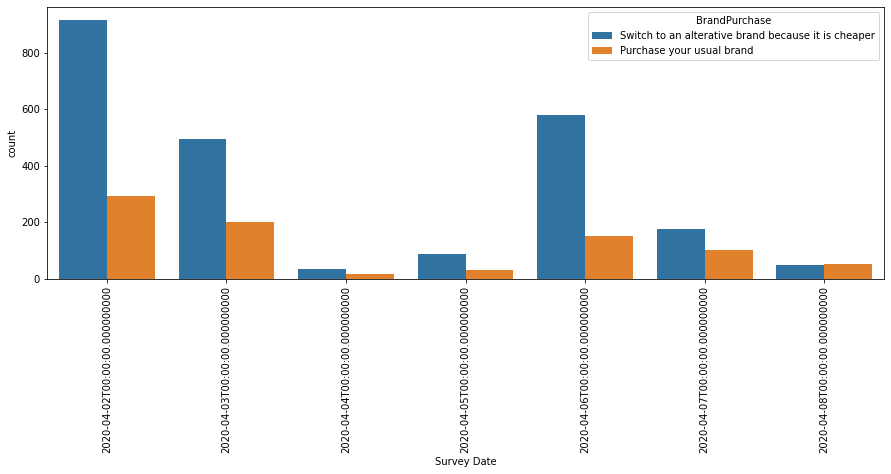

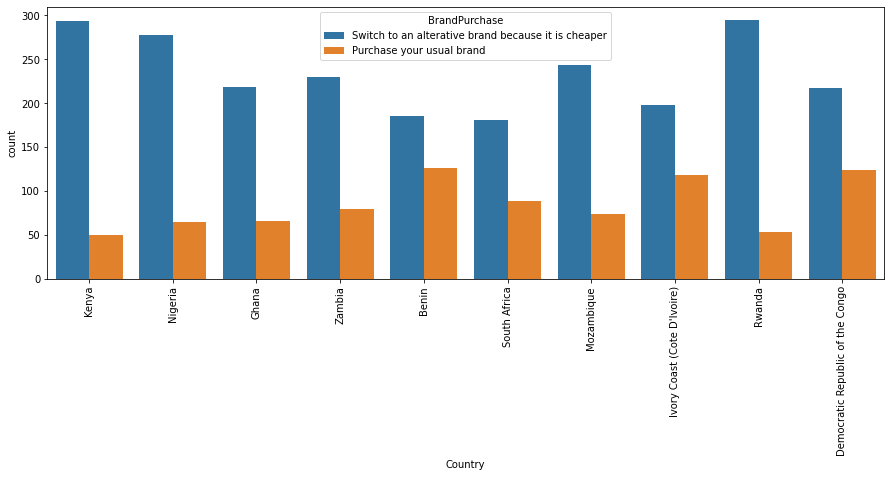

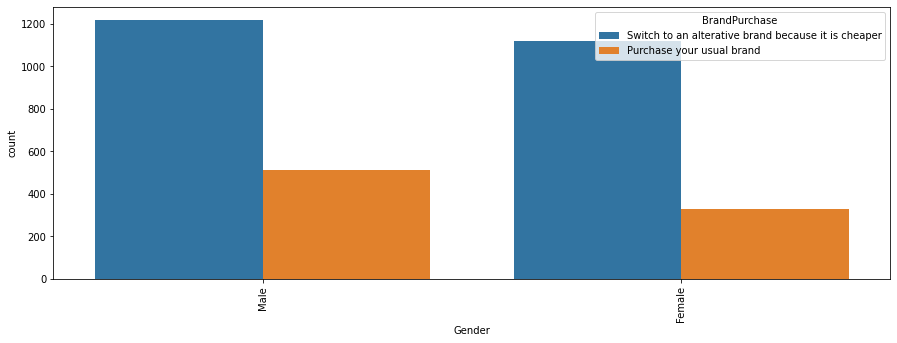

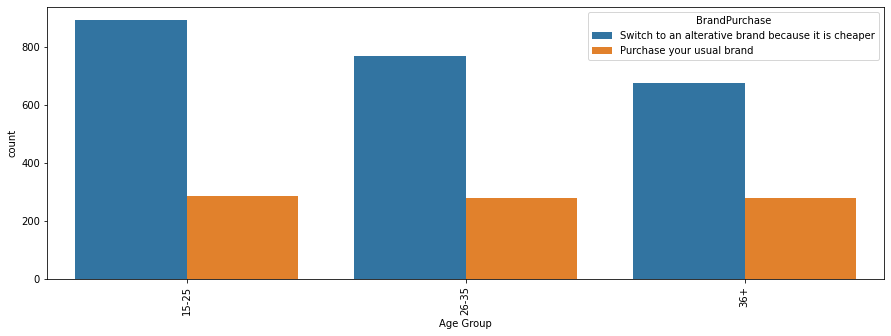

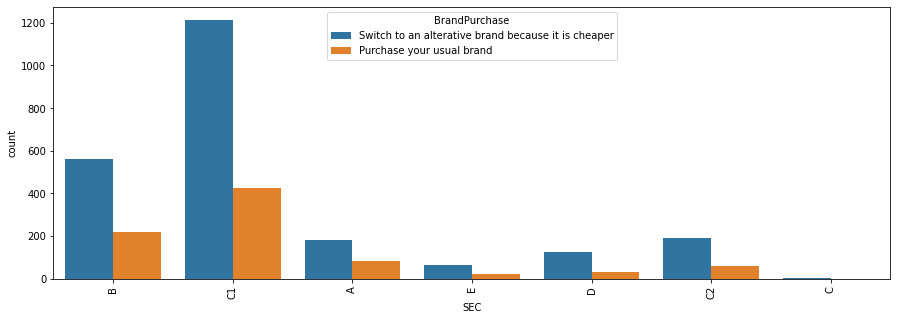

...

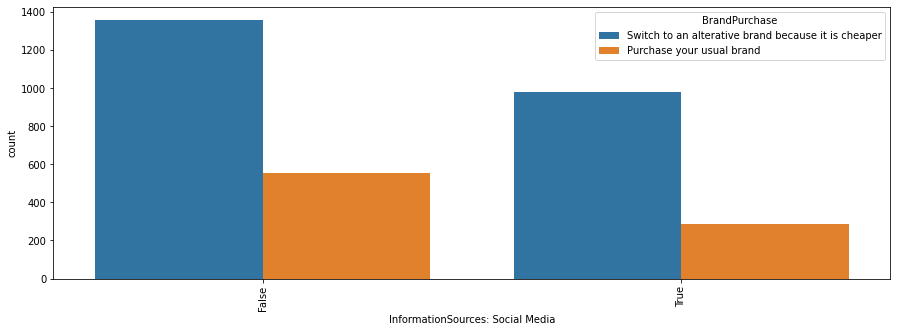

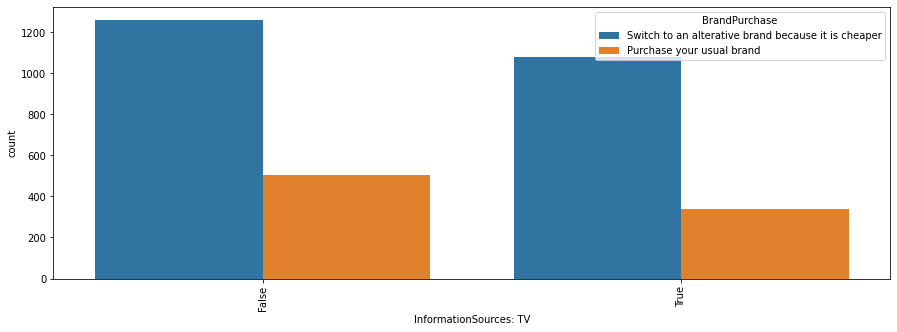

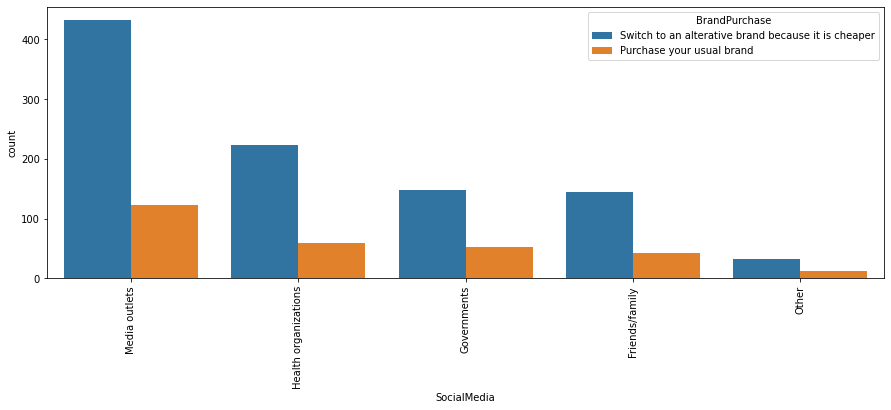

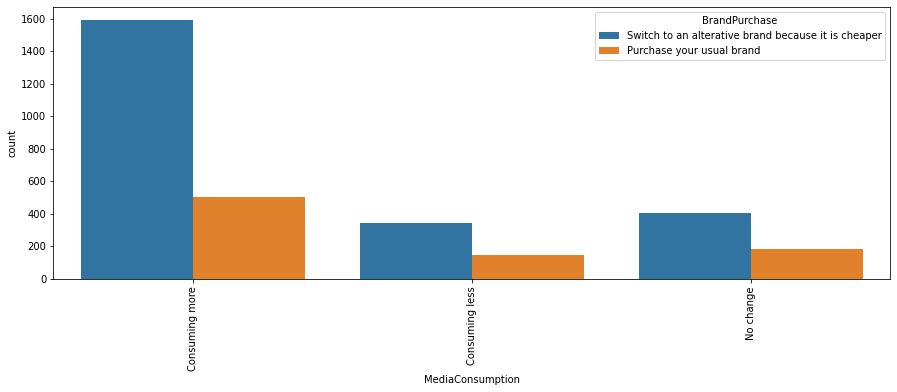

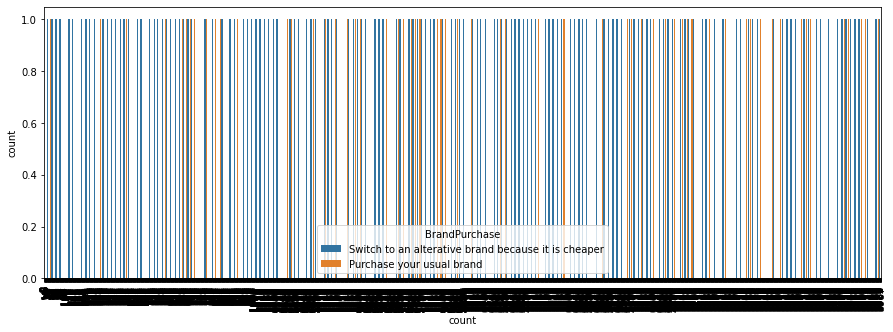

In [16]:
# loop through to visualize against first target "Brand Purchase"
bp = new_rawData["BrandPurchase"]
colNo = 0
while colNo < len(new_rawData.columns):
    plt.figure(figsize=(15,5))
    plt.rcParams['figure.figsize'] = (2,2)
    sns.countplot(x=new_rawData.columns[colNo], hue= bp, data=new_rawData)
    plt.xticks(rotation=90)
    colNo = colNo + 1 

<br>
<h2>Visualization for all the columns agains the second target variable (Food Shopping)</h2>

C:\Users\ABDUL FATAI\AppData\Local\Temp\ipykernel_5996\4002867920.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


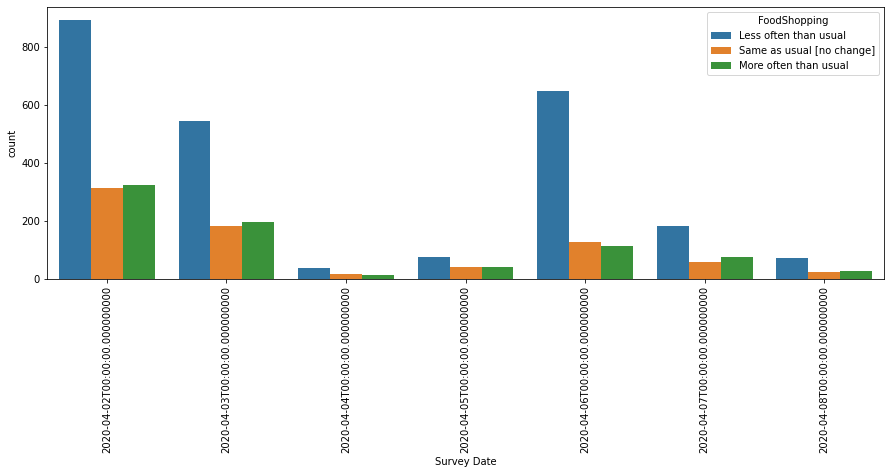

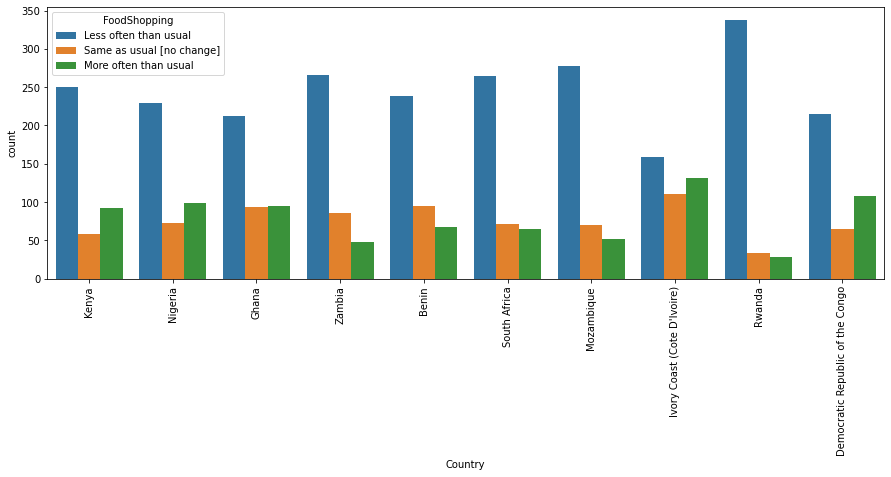

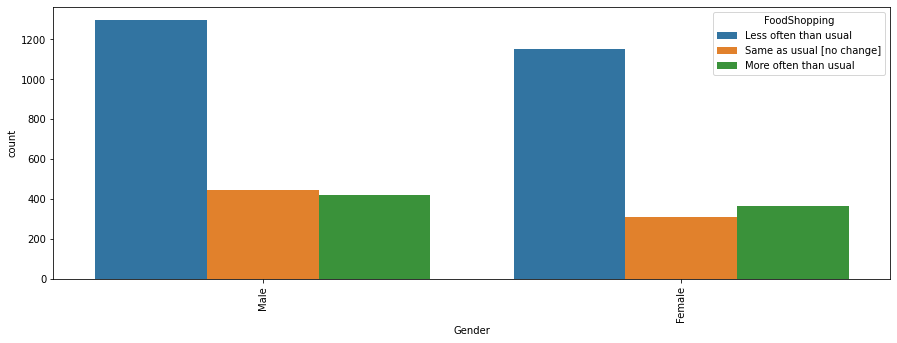

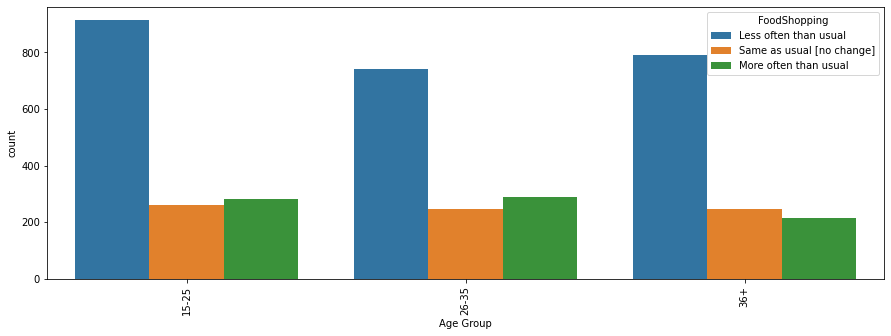

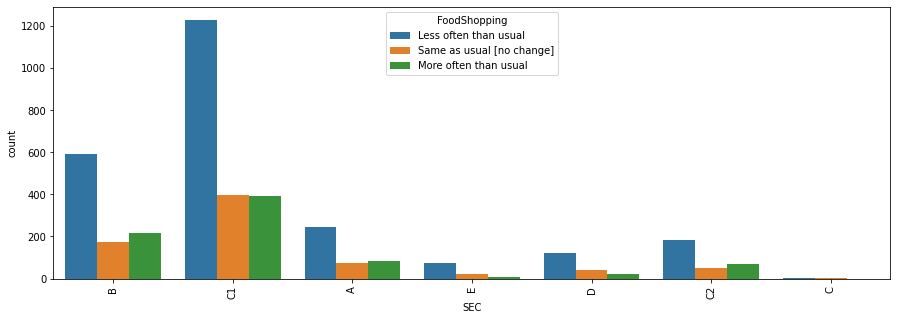

...

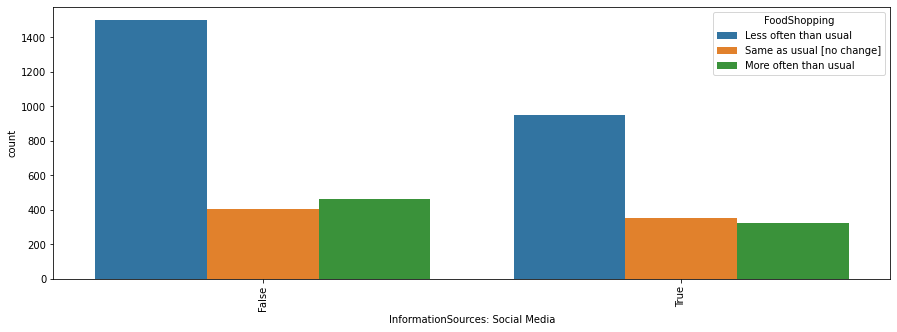

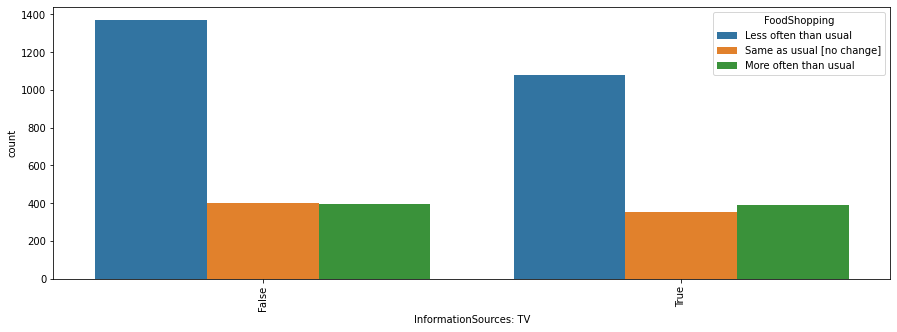

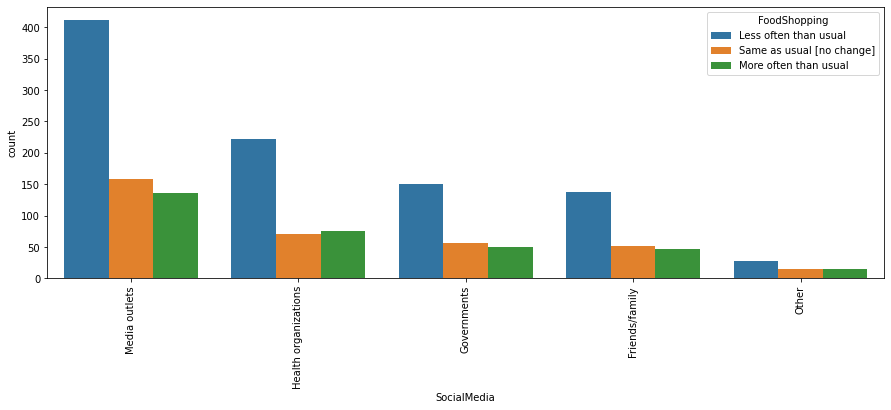

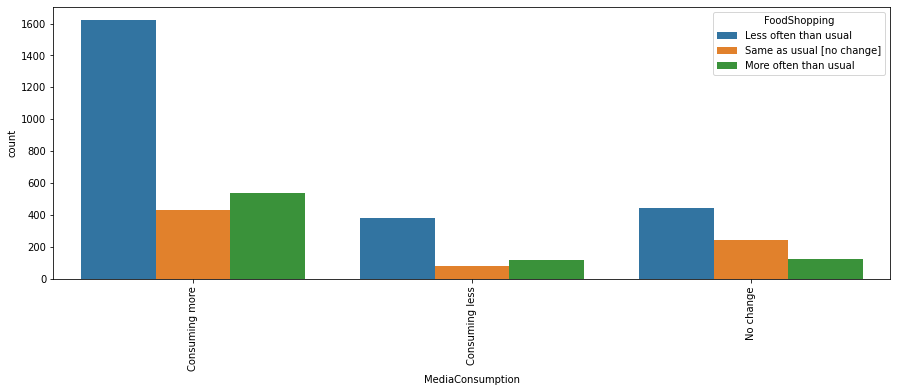

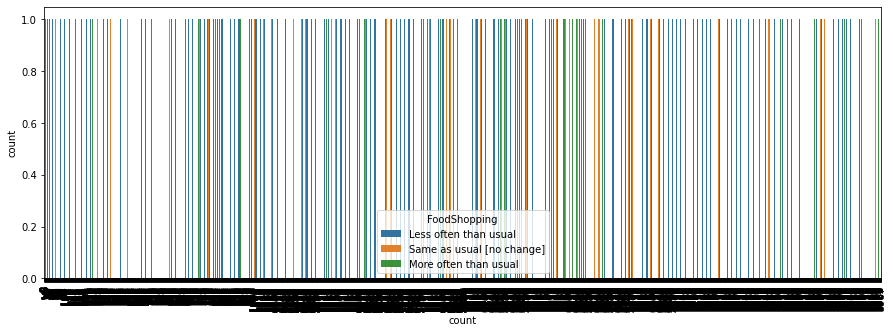

In [17]:
fs = new_rawData["FoodShopping"]
# print(bp)
colNo = 0
while colNo < len(new_rawData.columns):
    plt.figure(figsize=(15,5))
    plt.rcParams['figure.figsize'] = (2,2)
    sns.countplot(x=new_rawData.columns[colNo], hue= fs, data=new_rawData)
    plt.xticks(rotation=90)
    colNo = colNo + 1 

<br>
<h2>Visualization for all the columns agains the third target variable (Food Amount)</h2>

C:\Users\ABDUL FATAI\AppData\Local\Temp\ipykernel_5996\216282589.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


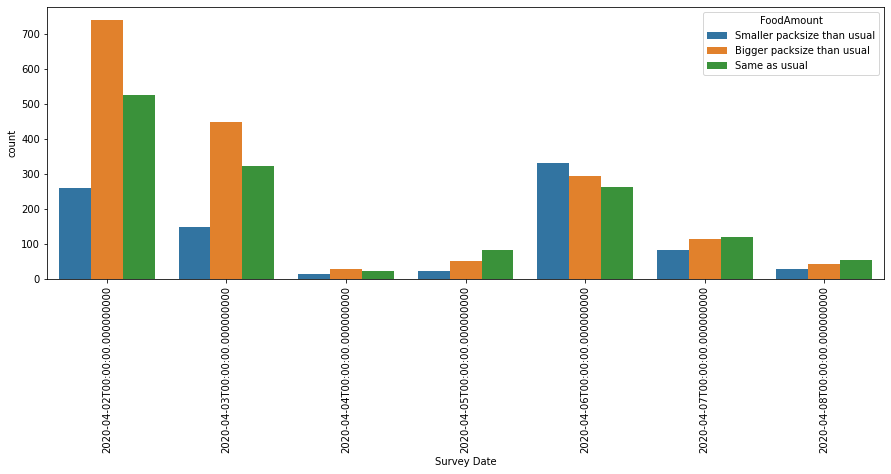

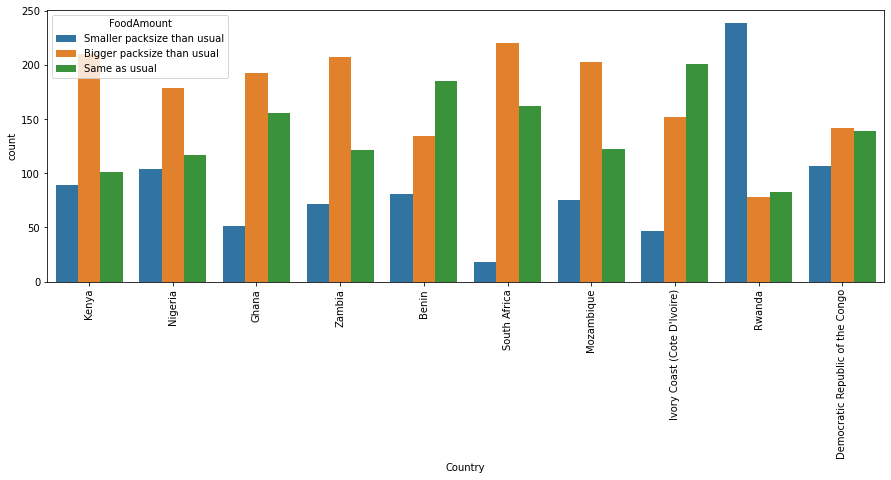

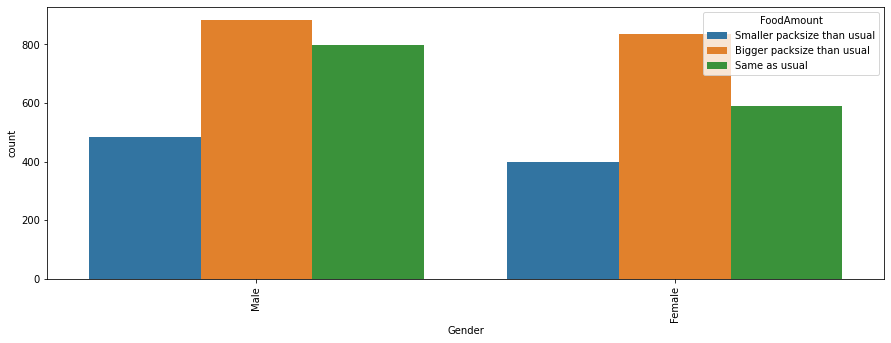

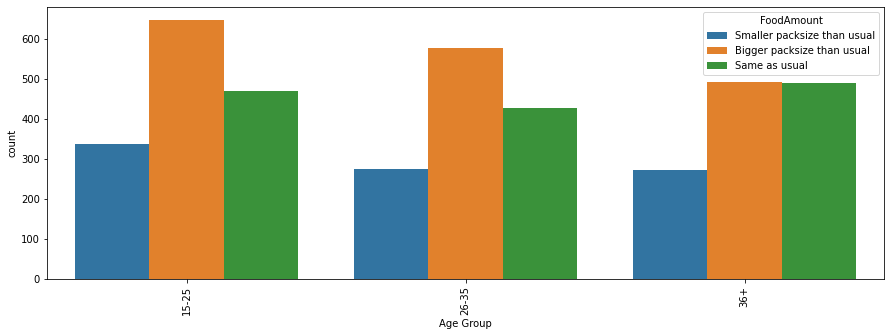

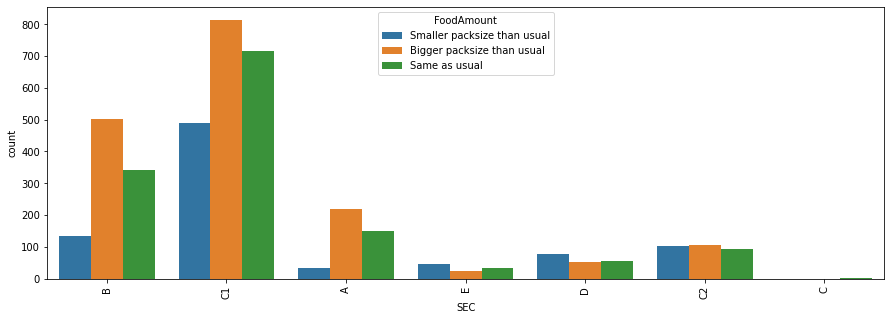

...

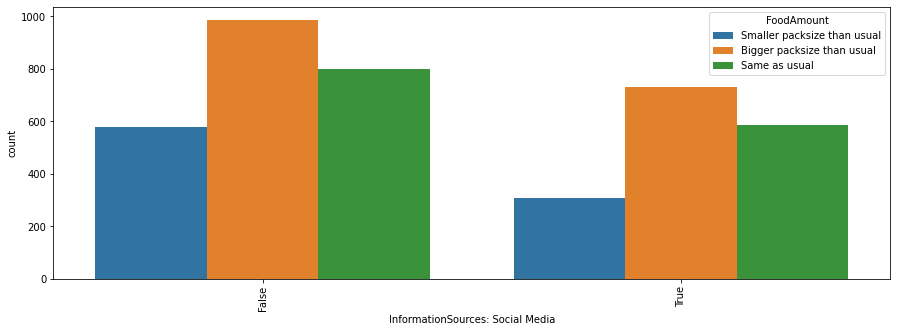

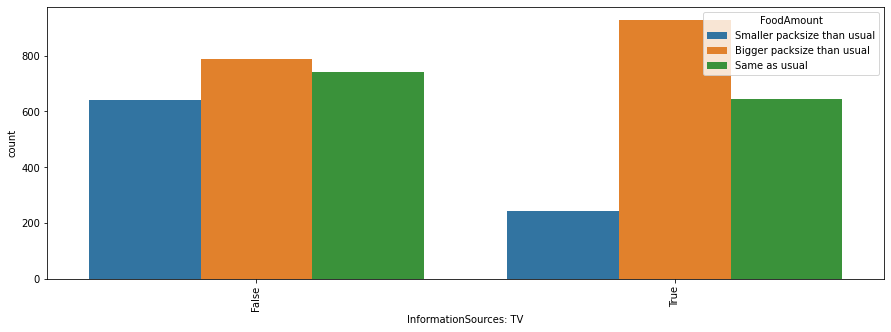

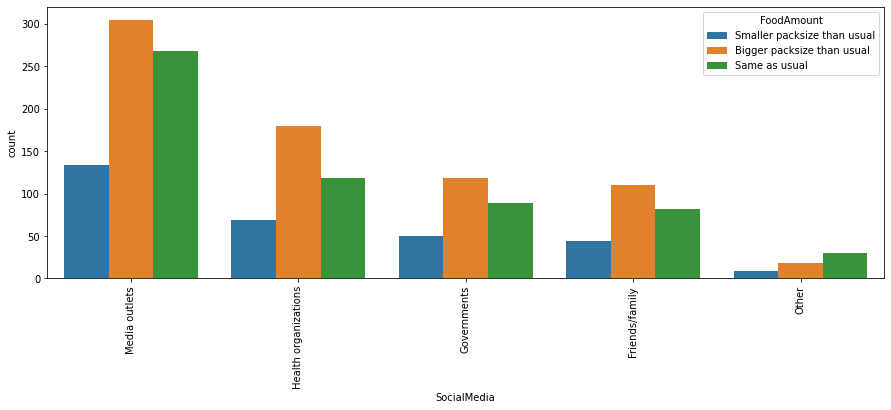

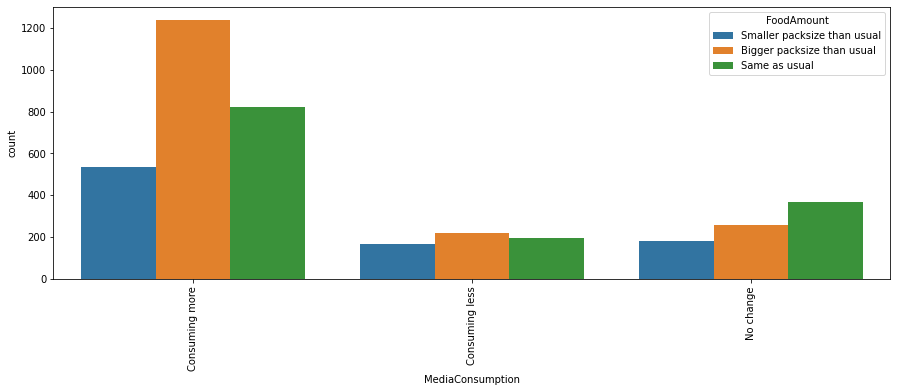

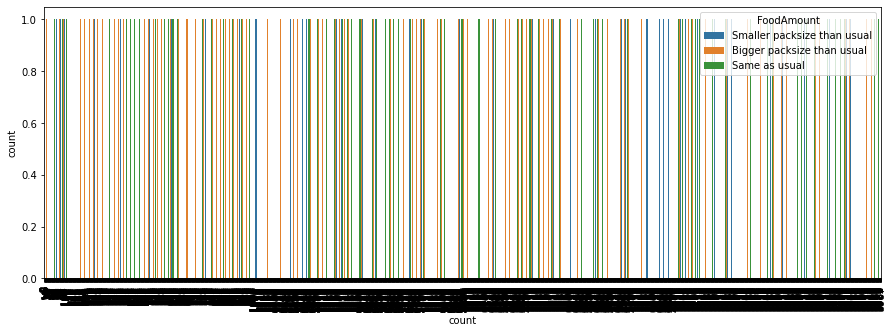

In [18]:
fa = new_rawData["FoodAmount"]
colNo = 0
while colNo < len(new_rawData.columns):
    plt.figure(figsize=(15,5))
    plt.rcParams['figure.figsize'] = (2,2)
    sns.countplot(x=new_rawData.columns[colNo], hue= fa, data=new_rawData)
    plt.xticks(rotation=90)
    colNo = colNo + 1 

<h2>Check for Outliers using Visualization (Boxplot) </h2>

C:\Users\ABDUL FATAI\AppData\Local\Temp\ipykernel_5996\3543824417.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(17,1))


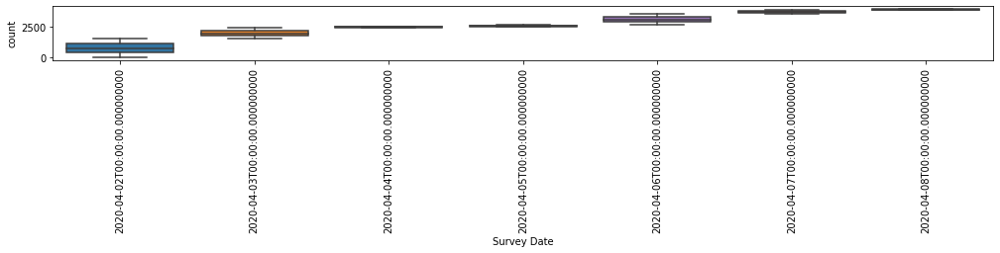

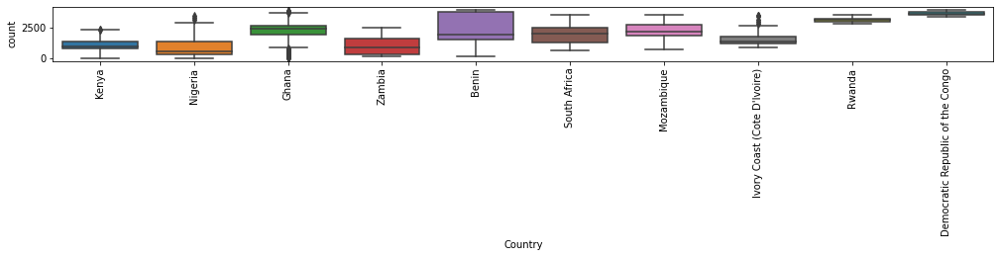

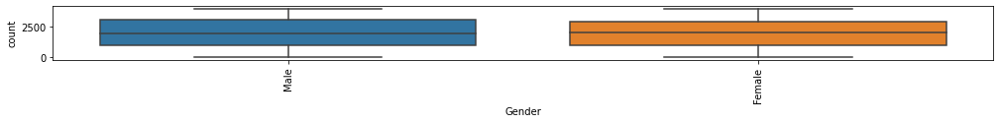

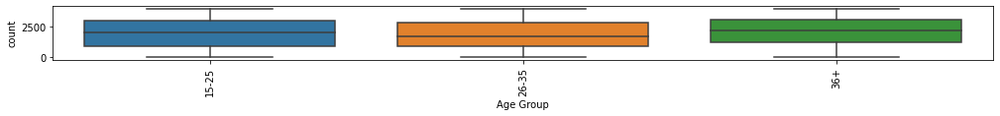

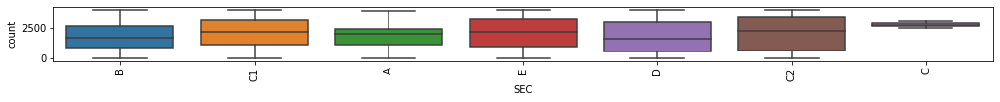

...

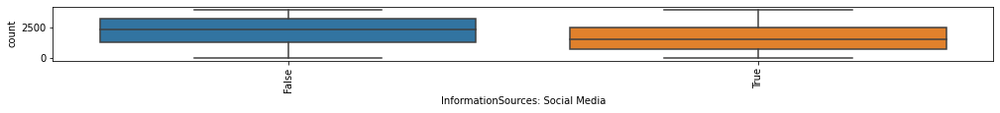

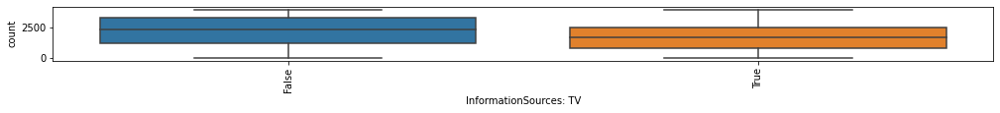

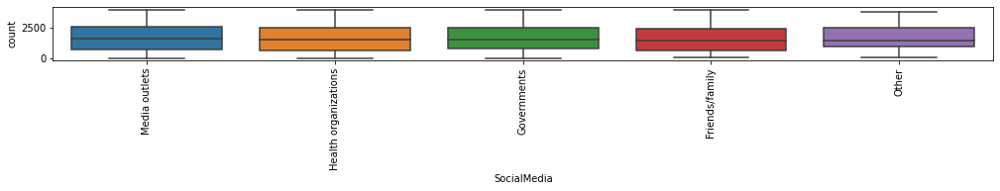

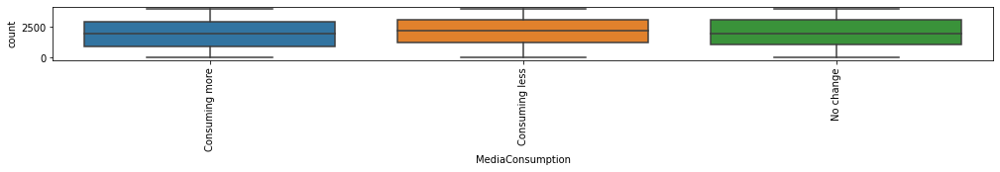

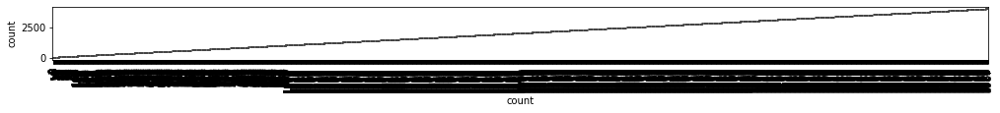

In [19]:
for column in new_rawData:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=new_rawData, x=column, y=new_rawData['count'])
        plt.xticks(rotation=90)

In [20]:
new_rawData["Age"] = AgeSeries
print(new_rawData["Age"])

0       20
1       28
2       20
3       32
4       25
        ..
3983    43
3984    21
3985    69
3986    26
3987    26
Name: Age, Length: 3988, dtype: int32


In [21]:
new_rawData = new_rawData.drop(labels='count', axis=1)
new_rawData.head()

,Survey Date,Country,Gender,Age Group,SEC,Age,BirthYear,Awareness,Urban/Rural,LevelConcern,...,Groups: Retailers,InformationSources: Friends/family,InformationSources: Government messages,InformationSources: Newspapers,InformationSources: Other,InformationSources: Radio,InformationSources: Social Media,InformationSources: TV,SocialMedia,MediaConsumption
0,2020-04-02,Kenya,Male,15-25,B,20,1995 and above,Yes,Rural area,5,...,False,False,True,False,False,False,False,False,NaN,Consuming more
1,2020-04-02,Kenya,Male,26-35,C1,28,1984 - 1994,Yes,Urban area,5,...,True,False,True,False,False,False,True,True,Media outlets,Consuming more
2,2020-04-02,Nigeria,Male,15-25,A,20,1995 and above,Yes,Urban area,5,...,False,False,False,False,False,False,True,False,Health organizations,Consuming more
3,2020-04-02,Kenya,Male,26-35,C1,32,1984 - 1994,Yes,Rural area,5,...,True,False,True,True,False,True,True,True,Health organizations,Consuming more
4,2020-04-02,Kenya,Male,15-25,B,25,NaN,Yes,Rural area,5,...,False,False,False,False,False,False,True,False,Media outlets,Consuming less


In [22]:
new_rawData.shape

(3988, 55)

<h3>Converted the dataset to csv</h3>

In [23]:
# new_rawData.to_csv("DataSet/AfterVisualization.csv")

<h2>Preprocessing Stage</h2>
<ol>
    <li>Handling missing values</li>
    <li>Fixing Outliers</li>
    <li>Conversion from Categorical to numerical Values</li>
</ol>

<h3>Handling Missing Values</h3>

In [24]:
new_rawData1 = new_rawData.drop(["FoodLocations2"], axis=1)

<h3> Handling the last missing value column because it is our target variable </h3>
<p>We will make use of the KNNImputer function from the impute module of the sklearn. KNNImputer helps to impute missing values present <br>in the observations by finding the nearest neighbors with the Euclidean distance matrix.
</p>

In [25]:
new_rawData1["BrandPurchase"]

0       Switch to an alterative brand because it is ch...
1                                                     NaN
2                                                     NaN
3       Switch to an alterative brand because it is ch...
4       Switch to an alterative brand because it is ch...
                              ...                        
3983    Switch to an alterative brand because it is ch...
3984                            Purchase your usual brand
3985                                                  NaN
3986                            Purchase your usual brand
3987                            Purchase your usual brand
Name: BrandPurchase, Length: 3988, dtype: object

In [26]:
new_rawData1["BrandPurchase"]= new_rawData1.BrandPurchase.map({"Switch to an alterative brand because it is cheaper":1, "Purchase your usual brand":0})
print(new_rawData1["BrandPurchase"])

0       1.0
1       NaN
2       NaN
3       1.0
4       1.0
       ... 
3983    1.0
3984    0.0
3985    NaN
3986    0.0
3987    0.0
Name: BrandPurchase, Length: 3988, dtype: float64


In [27]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=2)
bpMissing = imputer.fit_transform(new_rawData1[["LevelConcern", "BrandPurchase"]])

<p>I was able to make use of KNN Imputation to predict the missing values for the target column "Brand Purchase"</p>

In [28]:
new_rawData1["BrandPurchase"] = bpMissing[0:, 1:]
print(new_rawData1["BrandPurchase"])

0       1.0
1       1.0
2       1.0
3       1.0
4       1.0
       ... 
3983    1.0
3984    0.0
3985    1.0
3986    0.0
3987    0.0
Name: BrandPurchase, Length: 3988, dtype: float64


<h3> Conversion of Categorical Columns to Numerical Columns</h3>
<p>We will use the KNNImputer function from the impute module of the sklearn. KNNImputer helps to impute missing values present <br>in the observations by finding the nearest neighbors with the Euclidean distance matrix.
</p>

<h3>Conversion of Categorical Data to Numerical Data</h3>
<p>I will be making use of .get-dummies method</p>

In [29]:
CategoricalData = new_rawData1.drop(["Survey Date", "LevelConcern", "EconomicImpact", "GovernmentTrust", "BrandPurchase", "Country", "Age Group"], axis=1)

In [30]:
conversion = pd.get_dummies(CategoricalData)
conversion.head()

,Age,PreventativeMeasures: Avoiding public places,PreventativeMeasures: Avoiding public transport,PreventativeMeasures: Increasing hygiene,PreventativeMeasures: Other,PreventativeMeasures: Working from home,CommercialTrust: Banks,CommercialTrust: Brands,CommercialTrust: Other,CommercialTrust: Retailers,...,NonEssentialItems_Increased,NonEssentialItems_No change,SocialMedia_Friends/family,SocialMedia_Governments,SocialMedia_Health organizations,SocialMedia_Media outlets,SocialMedia_Other,MediaConsumption_Consuming less,MediaConsumption_Consuming more,MediaConsumption_No change
0,20,False,False,False,False,True,True,False,False,False,...,0,0,0,0,0,0,0,0,1,0
1,28,True,False,True,False,False,True,False,False,False,...,0,0,0,0,0,1,0,0,1,0
2,20,False,False,False,False,True,True,False,False,False,...,0,0,0,0,1,0,0,0,1,0
3,32,False,False,True,False,False,False,False,True,False,...,0,0,0,0,1,0,0,0,1,0
4,25,False,False,True,False,False,True,False,False,False,...,0,0,0,0,0,1,0,1,0,0


In [31]:
# conversion.shape
ConvertedData = conversion.iloc[:, 27:]
print(ConvertedData)

      Gender_Female  Gender_Male  SEC_A  SEC_B  SEC_C  SEC_C1  SEC_C2  SEC_D  \
0                 0            1      0      1      0       0       0      0   
1                 0            1      0      0      0       1       0      0   
2                 0            1      1      0      0       0       0      0   
3                 0            1      0      0      0       1       0      0   
4                 0            1      0      1      0       0       0      0   
...             ...          ...    ...    ...    ...     ...     ...    ...   
3983              0            1      0      0      0       0       1      0   
3984              0            1      0      0      0       1       0      0   
3985              0            1      0      0      0       1       0      0   
3986              0            1      0      0      0       1       0      0   
3987              0            1      0      0      0       0       0      0   

      SEC_E  BirthYear_1924 - 1934  ...

In [32]:
new_rawData1['FoodShopping'] = new_rawData1.FoodShopping.map({"More often than usual":2, "Same as usual [no change]":1, "Less often than usual":0})
print(new_rawData1['FoodShopping'])

0       0
1       1
2       0
3       0
4       0
       ..
3983    0
3984    0
3985    1
3986    2
3987    2
Name: FoodShopping, Length: 3988, dtype: int64


In [33]:
new_rawData1['FoodAmount'] = new_rawData1.FoodAmount.map({"Bigger packsize than usual":2, "Same as usual":1, "Smaller packsize than usual":0})
print(new_rawData1['FoodAmount'])

0       0
1       2
2       2
3       2
4       1
       ..
3983    2
3984    2
3985    1
3986    0
3987    0
Name: FoodAmount, Length: 3988, dtype: int64


In [34]:
ConvertedData["Survey Date"] = new_rawData1["Survey Date"]
ConvertedData["LevelConcern"] = new_rawData1["LevelConcern"]
ConvertedData["EconomicImpact"] = new_rawData1["EconomicImpact"]
ConvertedData["GovernmentTrust"] = new_rawData1["GovernmentTrust"]
ConvertedData["BrandPurchase"] = new_rawData1["BrandPurchase"]
ConvertedData["FoodShopping"] = new_rawData1['FoodShopping']
ConvertedData["FoodAmount"] = new_rawData1['FoodAmount']
ConvertedData["Country"] = new_rawData1["Country"]

In [35]:
ConvertedData.head()

,Gender_Female,Gender_Male,SEC_A,SEC_B,SEC_C,SEC_C1,SEC_C2,SEC_D,SEC_E,BirthYear_1924 - 1934,...,MediaConsumption_Consuming more,MediaConsumption_No change,Survey Date,LevelConcern,EconomicImpact,GovernmentTrust,BrandPurchase,FoodShopping,FoodAmount,Country
0,0,1,0,1,0,0,0,0,0,0,...,1,0,2020-04-02,5,5,1,1.0,0,0,Kenya
1,0,1,0,0,0,1,0,0,0,0,...,1,0,2020-04-02,5,3,2,1.0,1,2,Kenya
2,0,1,1,0,0,0,0,0,0,0,...,1,0,2020-04-02,5,4,4,1.0,0,2,Nigeria
3,0,1,0,0,0,1,0,0,0,0,...,1,0,2020-04-02,5,5,4,1.0,0,2,Kenya
4,0,1,0,1,0,0,0,0,0,0,...,0,0,2020-04-02,5,5,5,1.0,0,1,Kenya


<h2>Feature Selection</h2>
<p>For target 1(Brand Purchase)</p>

In [36]:
X = ConvertedData.drop(['Survey Date',"BrandPurchase", "Country"], axis=1)
y = ConvertedData["BrandPurchase"]

In [37]:
from sklearn.feature_selection import RFECV
from sklearn.svm import SVR

estimator = SVR(kernel="linear")
selector = RFECV(estimator, step=1, cv=5)

In [38]:
selector = selector.fit(X, y)

In [39]:
selector.support_

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

In [40]:
selector.ranking_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 5, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [41]:
X.columns

Index(['Gender_Female', 'Gender_Male', 'SEC_A', 'SEC_B', 'SEC_C', 'SEC_C1',
       'SEC_C2', 'SEC_D', 'SEC_E', 'BirthYear_1924 - 1934',
       'BirthYear_1934 - 1944', 'BirthYear_1944 - 1954',
       'BirthYear_1954 - 1964', 'BirthYear_1964 - 1974',
       'BirthYear_1974 - 1984', 'BirthYear_1984 - 1994',
       'BirthYear_1995 and above', 'BirthYear_NaN', 'Awareness_Yes',
       'Urban/Rural_Rural area', 'Urban/Rural_Urban area',
       'Concerns_Contracting the disease', 'Concerns_Economic impact',
       'Concerns_Global infections', 'Concerns_Local infections',
       'Concerns_Other', 'Concerns_Travel restrictions', 'RiskAwareness_No',
       'RiskAwareness_Yes', 'Tested_No', 'Tested_Not sure',
       'Tested_Yes - tested negative', 'Tested_Yes - tested positive',
       'VirusPrevention_No', 'VirusPrevention_Yes', 'HandWashing_0 times',
       'HandWashing_1-2 times', 'HandWashing_3-5 times',
       'HandWashing_More than 5 times', 'SocialDistancing_No',
       'SocialDistancing_

In [42]:
feature_selection = {'support':[ True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True], 'ranking': [1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 5, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'features':['Gender_Female', 'Gender_Male', 'SEC_A', 'SEC_B', 'SEC_C', 'SEC_C1',
       'SEC_C2', 'SEC_D', 'SEC_E', 'BirthYear_1924 - 1934',
       'BirthYear_1934 - 1944', 'BirthYear_1944 - 1954',
       'BirthYear_1954 - 1964', 'BirthYear_1964 - 1974',
       'BirthYear_1974 - 1984', 'BirthYear_1984 - 1994',
       'BirthYear_1995 and above', 'BirthYear_NaN', 'Awareness_Yes',
       'Urban/Rural_Rural area', 'Urban/Rural_Urban area',
       'Concerns_Contracting the disease', 'Concerns_Economic impact',
       'Concerns_Global infections', 'Concerns_Local infections',
       'Concerns_Other', 'Concerns_Travel restrictions', 'RiskAwareness_No',
       'RiskAwareness_Yes', 'Tested_No', 'Tested_Not sure',
       'Tested_Yes - tested negative', 'Tested_Yes - tested positive',
       'VirusPrevention_No', 'VirusPrevention_Yes', 'HandWashing_0 times',
       'HandWashing_1-2 times', 'HandWashing_3-5 times',
       'HandWashing_More than 5 times', 'SocialDistancing_No',
       'SocialDistancing_Yes', 'HealthBehavior_Go to doctor',
       'HealthBehavior_Go to hospital', 'HealthBehavior_Not sure',
       'HealthBehavior_Stay home', 'MarketOperability_All are closed',
       'MarketOperability_All are open', 'MarketOperability_Most are closed',
       'MarketOperability_Most are open', 'MarketOperability_Some are open',
       'FoodLocations_No', 'FoodLocations_Yes',
       'FoodShopping_Less often than usual',
       'FoodShopping_More often than usual',
       'FoodShopping_Same as usual [no change]',
       'FoodAmount_Bigger packsize than usual', 'FoodAmount_Same as usual',
       'FoodAmount_Smaller packsize than usual', 'Foodworry_No',
       'Foodworry_Yes', 'NonEssentialItems_Decreased',
       'NonEssentialItems_Increased', 'NonEssentialItems_No change',
       'SocialMedia_Friends/family', 'SocialMedia_Governments',
       'SocialMedia_Health organizations', 'SocialMedia_Media outlets',
       'SocialMedia_Other', 'MediaConsumption_Consuming less',
       'MediaConsumption_Consuming more', 'MediaConsumption_No change',
       'LevelConcern', 'EconomicImpact', 'GovernmentTrust', 'FoodShopping',
       'FoodAmount']}

In [43]:
feature_selection_data = pd.DataFrame(feature_selection)

In [44]:
feature_selection_data.head()

,support,ranking,features
0,True,1,Gender_Female
1,True,1,Gender_Male
2,True,1,SEC_A
3,True,1,SEC_B
4,True,1,SEC_C


In [45]:
selected_features = feature_selection_data.loc[feature_selection_data['support'] == False, ['features']]
selected_features['features'].values

array(['BirthYear_1924 - 1934', 'Awareness_Yes', 'RiskAwareness_Yes',
       'FoodAmount_Same as usual'], dtype=object)

In [46]:
non_selected_features = ['BirthYear_1924 - 1934', 'Awareness_Yes', 'RiskAwareness_Yes',
       'FoodAmount_Same as usual']

In [47]:
X_new = X.drop(non_selected_features, axis=1)
X_new.head()

,Gender_Female,Gender_Male,SEC_A,SEC_B,SEC_C,SEC_C1,SEC_C2,SEC_D,SEC_E,BirthYear_1934 - 1944,...,SocialMedia_Media outlets,SocialMedia_Other,MediaConsumption_Consuming less,MediaConsumption_Consuming more,MediaConsumption_No change,LevelConcern,EconomicImpact,GovernmentTrust,FoodShopping,FoodAmount
0,0,1,0,1,0,0,0,0,0,0,...,0,0,0,1,0,5,5,1,0,0
1,0,1,0,0,0,1,0,0,0,0,...,1,0,0,1,0,5,3,2,1,2
2,0,1,1,0,0,0,0,0,0,0,...,0,0,0,1,0,5,4,4,0,2
3,0,1,0,0,0,1,0,0,0,0,...,0,0,0,1,0,5,5,4,0,2
4,0,1,0,1,0,0,0,0,0,0,...,1,0,1,0,0,5,5,5,0,1


<h2>Feature Selection</h2>
<p>For target 2 (food shopping)</p>

In [48]:
X1 = ConvertedData.drop(['Survey Date','FoodShopping', "Country"], axis=1)
y1 = ConvertedData['FoodShopping']

In [49]:
from sklearn.feature_selection import RFECV
from sklearn.svm import SVR

estimator1 = SVR(kernel="linear")
selector1 = RFECV(estimator1, step=1, cv=5)

In [50]:
selector1 = selector1.fit(X1, y1)

In [51]:
selector1.support_

array([ True,  True,  True, False, False, False,  True, False,  True,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False,  True,  True,  True,  True, False,
       False, False,  True,  True, False,  True, False,  True,  True,
       False, False, False,  True,  True,  True,  True,  True, False,
       False,  True,  True,  True, False,  True,  True,  True,  True,
       False, False,  True,  True,  True, False, False,  True,  True,
       False,  True,  True, False, False,  True,  True, False, False,
       False,  True, False, False])

In [52]:
selector1.ranking_

array([ 1,  1,  1, 20, 40, 22,  1, 11,  1, 38, 39, 27, 17, 18,  4, 33,  1,
        9, 36, 29, 35, 26,  1,  1,  1,  1,  2, 13,  5,  1,  1, 32,  1, 14,
        1,  1, 21, 12, 28,  1,  1,  1,  1,  1, 30,  3,  1,  1,  1, 16,  1,
        1,  1,  1, 37, 10,  1,  1,  1,  6, 24,  1,  1,  7,  1,  1, 23, 31,
        1,  1, 25,  8, 34,  1, 19, 15])

In [53]:
X1.columns

Index(['Gender_Female', 'Gender_Male', 'SEC_A', 'SEC_B', 'SEC_C', 'SEC_C1',
       'SEC_C2', 'SEC_D', 'SEC_E', 'BirthYear_1924 - 1934',
       'BirthYear_1934 - 1944', 'BirthYear_1944 - 1954',
       'BirthYear_1954 - 1964', 'BirthYear_1964 - 1974',
       'BirthYear_1974 - 1984', 'BirthYear_1984 - 1994',
       'BirthYear_1995 and above', 'BirthYear_NaN', 'Awareness_Yes',
       'Urban/Rural_Rural area', 'Urban/Rural_Urban area',
       'Concerns_Contracting the disease', 'Concerns_Economic impact',
       'Concerns_Global infections', 'Concerns_Local infections',
       'Concerns_Other', 'Concerns_Travel restrictions', 'RiskAwareness_No',
       'RiskAwareness_Yes', 'Tested_No', 'Tested_Not sure',
       'Tested_Yes - tested negative', 'Tested_Yes - tested positive',
       'VirusPrevention_No', 'VirusPrevention_Yes', 'HandWashing_0 times',
       'HandWashing_1-2 times', 'HandWashing_3-5 times',
       'HandWashing_More than 5 times', 'SocialDistancing_No',
       'SocialDistancing_

In [54]:
feature_selection1 = {'support':[True,  True,  True, False, False, False,  True, False,  True,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False,  True,  True,  True,  True, False,
       False, False,  True,  True, False,  True, False,  True,  True,
       False, False, False,  True,  True,  True,  True,  True, False,
       False,  True,  True,  True, False,  True,  True,  True,  True,
       False, False,  True,  True,  True, False, False,  True,  True,
       False,  True,  True, False, False,  True,  True, False, False,
       False,  True, False, False], 'ranking': [ 1,  1,  1, 20, 40, 22,  1, 11,  1, 38, 39, 27, 17, 18,  4, 33,  1,
        9, 36, 29, 35, 26,  1,  1,  1,  1,  2, 13,  5,  1,  1, 32,  1, 14,
        1,  1, 21, 12, 28,  1,  1,  1,  1,  1, 30,  3,  1,  1,  1, 16,  1,
        1,  1,  1, 37, 10,  1,  1,  1,  6, 24,  1,  1,  7,  1,  1, 23, 31,
        1,  1, 25,  8, 34,  1, 19, 15], 'features':['Gender_Female', 'Gender_Male', 'SEC_A', 'SEC_B', 'SEC_C', 'SEC_C1',
       'SEC_C2', 'SEC_D', 'SEC_E', 'BirthYear_1924 - 1934',
       'BirthYear_1934 - 1944', 'BirthYear_1944 - 1954',
       'BirthYear_1954 - 1964', 'BirthYear_1964 - 1974',
       'BirthYear_1974 - 1984', 'BirthYear_1984 - 1994',
       'BirthYear_1995 and above', 'BirthYear_NaN', 'Awareness_Yes',
       'Urban/Rural_Rural area', 'Urban/Rural_Urban area',
       'Concerns_Contracting the disease', 'Concerns_Economic impact',
       'Concerns_Global infections', 'Concerns_Local infections',
       'Concerns_Other', 'Concerns_Travel restrictions', 'RiskAwareness_No',
       'RiskAwareness_Yes', 'Tested_No', 'Tested_Not sure',
       'Tested_Yes - tested negative', 'Tested_Yes - tested positive',
       'VirusPrevention_No', 'VirusPrevention_Yes', 'HandWashing_0 times',
       'HandWashing_1-2 times', 'HandWashing_3-5 times',
       'HandWashing_More than 5 times', 'SocialDistancing_No',
       'SocialDistancing_Yes', 'HealthBehavior_Go to doctor',
       'HealthBehavior_Go to hospital', 'HealthBehavior_Not sure',
       'HealthBehavior_Stay home', 'MarketOperability_All are closed',
       'MarketOperability_All are open', 'MarketOperability_Most are closed',
       'MarketOperability_Most are open', 'MarketOperability_Some are open',
       'FoodLocations_No', 'FoodLocations_Yes',
       'FoodShopping_Less often than usual',
       'FoodShopping_More often than usual',
       'FoodShopping_Same as usual [no change]',
       'FoodAmount_Bigger packsize than usual', 'FoodAmount_Same as usual',
       'FoodAmount_Smaller packsize than usual', 'Foodworry_No',
       'Foodworry_Yes', 'NonEssentialItems_Decreased',
       'NonEssentialItems_Increased', 'NonEssentialItems_No change',
       'SocialMedia_Friends/family', 'SocialMedia_Governments',
       'SocialMedia_Health organizations', 'SocialMedia_Media outlets',
       'SocialMedia_Other', 'MediaConsumption_Consuming less',
       'MediaConsumption_Consuming more', 'MediaConsumption_No change',
       'LevelConcern', 'EconomicImpact', 'GovernmentTrust', 'BrandPurchase',
       'FoodAmount']}

In [55]:
feature_selection_data1 = pd.DataFrame(feature_selection1)
feature_selection_data1.head()

,support,ranking,features
0,True,1,Gender_Female
1,True,1,Gender_Male
2,True,1,SEC_A
3,False,20,SEC_B
4,False,40,SEC_C


In [56]:
feature_selection_data1 = pd.DataFrame(feature_selection1)
feature_selection_data1.head()

,support,ranking,features
0,True,1,Gender_Female
1,True,1,Gender_Male
2,True,1,SEC_A
3,False,20,SEC_B
4,False,40,SEC_C


In [57]:
non_selected_features1 =['SEC_B', 'SEC_C', 'SEC_C1', 'SEC_D', 'BirthYear_1924 - 1934',
       'BirthYear_1934 - 1944', 'BirthYear_1944 - 1954',
       'BirthYear_1954 - 1964', 'BirthYear_1964 - 1974',
       'BirthYear_1974 - 1984', 'BirthYear_1984 - 1994', 'BirthYear_NaN',
       'Awareness_Yes', 'Urban/Rural_Rural area',
       'Urban/Rural_Urban area', 'Concerns_Contracting the disease',
       'Concerns_Travel restrictions', 'RiskAwareness_No',
       'RiskAwareness_Yes', 'Tested_Yes - tested negative',
       'VirusPrevention_No', 'HandWashing_1-2 times',
       'HandWashing_3-5 times', 'HandWashing_More than 5 times',
       'HealthBehavior_Stay home', 'MarketOperability_All are closed',
       'MarketOperability_Some are open',
       'FoodShopping_Same as usual [no change]',
       'FoodAmount_Bigger packsize than usual', 'Foodworry_Yes',
       'NonEssentialItems_Decreased', 'SocialMedia_Friends/family',
       'SocialMedia_Media outlets', 'SocialMedia_Other',
       'MediaConsumption_No change', 'LevelConcern', 'EconomicImpact',
       'BrandPurchase', 'FoodAmount']

In [58]:
X_new1 = X1.drop(non_selected_features1, axis=1)
X_new1.head()

,Gender_Female,Gender_Male,SEC_A,SEC_C2,SEC_E,BirthYear_1995 and above,Concerns_Economic impact,Concerns_Global infections,Concerns_Local infections,Concerns_Other,...,FoodAmount_Same as usual,FoodAmount_Smaller packsize than usual,Foodworry_No,NonEssentialItems_Increased,NonEssentialItems_No change,SocialMedia_Governments,SocialMedia_Health organizations,MediaConsumption_Consuming less,MediaConsumption_Consuming more,GovernmentTrust
0,0,1,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,1,1
1,0,1,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,1,2
2,0,1,1,0,0,1,0,0,0,0,...,0,0,1,0,0,0,1,0,1,4
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,4
4,0,1,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,1,0,5


<h2>Feature Selection</h2>
<p>For target 3 (food amount)</p>

In [59]:
X2 = ConvertedData.drop(['Survey Date','FoodAmount',"Country"], axis=1)
y2 = ConvertedData['FoodAmount']

In [60]:
from sklearn.feature_selection import RFECV
from sklearn.svm import SVR

estimator2 = SVR(kernel="linear")
selector2 = RFECV(estimator2, step=1, cv=5)

In [61]:
selector2 = selector2.fit(X2, y2)

In [62]:
selector2.support_

array([ True, False,  True,  True, False, False,  True, False,  True,
       False, False, False,  True,  True,  True,  True,  True, False,
       False,  True,  True,  True,  True, False,  True, False,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True, False, False,  True,  True,  True,  True, False,  True,
        True,  True,  True, False,  True,  True, False, False, False,
        True,  True, False,  True, False,  True,  True,  True, False,
        True, False,  True,  True, False, False, False,  True, False,
       False, False,  True, False])

In [63]:
selector2.ranking_

array([ 1, 17,  1,  1, 31, 18,  1,  2,  1, 27, 29, 25,  1,  1,  1,  1,  1,
       24, 28,  1,  1,  1,  1, 11,  1, 23,  1,  1, 15,  1,  1,  1,  1,  1,
        1,  1,  1, 13,  5,  1,  1,  1,  1,  6,  1,  1,  1,  1,  8,  1,  1,
       16, 19,  9,  1,  1, 30,  1, 14,  1,  1,  1, 10,  1,  3,  1,  1, 21,
        7, 22,  1, 26,  4, 20,  1, 12])

In [64]:
X2.columns

Index(['Gender_Female', 'Gender_Male', 'SEC_A', 'SEC_B', 'SEC_C', 'SEC_C1',
       'SEC_C2', 'SEC_D', 'SEC_E', 'BirthYear_1924 - 1934',
       'BirthYear_1934 - 1944', 'BirthYear_1944 - 1954',
       'BirthYear_1954 - 1964', 'BirthYear_1964 - 1974',
       'BirthYear_1974 - 1984', 'BirthYear_1984 - 1994',
       'BirthYear_1995 and above', 'BirthYear_NaN', 'Awareness_Yes',
       'Urban/Rural_Rural area', 'Urban/Rural_Urban area',
       'Concerns_Contracting the disease', 'Concerns_Economic impact',
       'Concerns_Global infections', 'Concerns_Local infections',
       'Concerns_Other', 'Concerns_Travel restrictions', 'RiskAwareness_No',
       'RiskAwareness_Yes', 'Tested_No', 'Tested_Not sure',
       'Tested_Yes - tested negative', 'Tested_Yes - tested positive',
       'VirusPrevention_No', 'VirusPrevention_Yes', 'HandWashing_0 times',
       'HandWashing_1-2 times', 'HandWashing_3-5 times',
       'HandWashing_More than 5 times', 'SocialDistancing_No',
       'SocialDistancing_

In [65]:
feature_selection2 = {'support':[True, False,  True,  True, False, False,  True, False,  True,
       False, False, False,  True,  True,  True,  True,  True, False,
       False,  True,  True,  True,  True, False,  True, False,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True, False, False,  True,  True,  True,  True, False,  True,
        True,  True,  True, False,  True,  True, False, False, False,
        True,  True, False,  True, False,  True,  True,  True, False,
        True, False,  True,  True, False, False, False,  True, False,
       False, False,  True, False], 'ranking': [1, 17,  1,  1, 31, 18,  1,  2,  1, 27, 29, 25,  1,  1,  1,  1,  1,
       24, 28,  1,  1,  1,  1, 11,  1, 23,  1,  1, 15,  1,  1,  1,  1,  1,
        1,  1,  1, 13,  5,  1,  1,  1,  1,  6,  1,  1,  1,  1,  8,  1,  1,
       16, 19,  9,  1,  1, 30,  1, 14,  1,  1,  1, 10,  1,  3,  1,  1, 21,
        7, 22,  1, 26,  4, 20,  1, 12], 'features':['Gender_Female', 'Gender_Male', 'SEC_A', 'SEC_B', 'SEC_C', 'SEC_C1',
       'SEC_C2', 'SEC_D', 'SEC_E', 'BirthYear_1924 - 1934',
       'BirthYear_1934 - 1944', 'BirthYear_1944 - 1954',
       'BirthYear_1954 - 1964', 'BirthYear_1964 - 1974',
       'BirthYear_1974 - 1984', 'BirthYear_1984 - 1994',
       'BirthYear_1995 and above', 'BirthYear_NaN', 'Awareness_Yes',
       'Urban/Rural_Rural area', 'Urban/Rural_Urban area',
       'Concerns_Contracting the disease', 'Concerns_Economic impact',
       'Concerns_Global infections', 'Concerns_Local infections',
       'Concerns_Other', 'Concerns_Travel restrictions', 'RiskAwareness_No',
       'RiskAwareness_Yes', 'Tested_No', 'Tested_Not sure',
       'Tested_Yes - tested negative', 'Tested_Yes - tested positive',
       'VirusPrevention_No', 'VirusPrevention_Yes', 'HandWashing_0 times',
       'HandWashing_1-2 times', 'HandWashing_3-5 times',
       'HandWashing_More than 5 times', 'SocialDistancing_No',
       'SocialDistancing_Yes', 'HealthBehavior_Go to doctor',
       'HealthBehavior_Go to hospital', 'HealthBehavior_Not sure',
       'HealthBehavior_Stay home', 'MarketOperability_All are closed',
       'MarketOperability_All are open', 'MarketOperability_Most are closed',
       'MarketOperability_Most are open', 'MarketOperability_Some are open',
       'FoodLocations_No', 'FoodLocations_Yes',
       'FoodShopping_Less often than usual',
       'FoodShopping_More often than usual',
       'FoodShopping_Same as usual [no change]',
       'FoodAmount_Bigger packsize than usual', 'FoodAmount_Same as usual',
       'FoodAmount_Smaller packsize than usual', 'Foodworry_No',
       'Foodworry_Yes', 'NonEssentialItems_Decreased',
       'NonEssentialItems_Increased', 'NonEssentialItems_No change',
       'SocialMedia_Friends/family', 'SocialMedia_Governments',
       'SocialMedia_Health organizations', 'SocialMedia_Media outlets',
       'SocialMedia_Other', 'MediaConsumption_Consuming less',
       'MediaConsumption_Consuming more', 'MediaConsumption_No change',
       'LevelConcern', 'EconomicImpact', 'GovernmentTrust', 'BrandPurchase',
       'FoodShopping']}

In [66]:
feature_selection_data2 = pd.DataFrame(feature_selection2)
feature_selection_data2.head()

,support,ranking,features
0,True,1,Gender_Female
1,False,17,Gender_Male
2,True,1,SEC_A
3,True,1,SEC_B
4,False,31,SEC_C


In [67]:
selected_features2 = feature_selection_data2.loc[feature_selection_data2['support'] == False, ['features']]
selected_features2['features'].values

array(['Gender_Male', 'SEC_C', 'SEC_C1', 'SEC_D', 'BirthYear_1924 - 1934',
       'BirthYear_1934 - 1944', 'BirthYear_1944 - 1954', 'BirthYear_NaN',
       'Awareness_Yes', 'Concerns_Global infections', 'Concerns_Other',
       'RiskAwareness_Yes', 'HandWashing_3-5 times',
       'HandWashing_More than 5 times', 'HealthBehavior_Not sure',
       'MarketOperability_Most are open', 'FoodLocations_Yes',
       'FoodShopping_Less often than usual',
       'FoodShopping_More often than usual', 'FoodAmount_Same as usual',
       'Foodworry_No', 'NonEssentialItems_No change',
       'SocialMedia_Governments', 'SocialMedia_Other',
       'MediaConsumption_Consuming less',
       'MediaConsumption_Consuming more', 'LevelConcern',
       'EconomicImpact', 'GovernmentTrust', 'FoodShopping'], dtype=object)

In [68]:
non_selected_features2 =['Gender_Male', 'SEC_C', 'SEC_C1', 'SEC_D', 'BirthYear_1924 - 1934',
       'BirthYear_1934 - 1944', 'BirthYear_1944 - 1954', 'BirthYear_NaN',
       'Awareness_Yes', 'Concerns_Global infections', 'Concerns_Other',
       'RiskAwareness_Yes', 'HandWashing_3-5 times',
       'HandWashing_More than 5 times', 'HealthBehavior_Not sure',
       'MarketOperability_Most are open', 'FoodLocations_Yes',
       'FoodShopping_Less often than usual',
       'FoodShopping_More often than usual', 'FoodAmount_Same as usual',
       'Foodworry_No', 'NonEssentialItems_No change',
       'SocialMedia_Governments', 'SocialMedia_Other',
       'MediaConsumption_Consuming less',
       'MediaConsumption_Consuming more', 'LevelConcern',
       'EconomicImpact', 'GovernmentTrust', 'FoodShopping']

In [69]:
X_new2 = X2.drop(non_selected_features2, axis=1)
X_new2.head()

,Gender_Female,SEC_A,SEC_B,SEC_C2,SEC_E,BirthYear_1954 - 1964,BirthYear_1964 - 1974,BirthYear_1974 - 1984,BirthYear_1984 - 1994,BirthYear_1995 and above,...,FoodAmount_Bigger packsize than usual,FoodAmount_Smaller packsize than usual,Foodworry_Yes,NonEssentialItems_Decreased,NonEssentialItems_Increased,SocialMedia_Friends/family,SocialMedia_Health organizations,SocialMedia_Media outlets,MediaConsumption_No change,BrandPurchase
0,0,0,1,0,0,0,0,0,0,1,...,0,1,1,1,0,0,0,0,0,1.0
1,0,0,0,0,0,0,0,0,1,0,...,1,0,0,1,0,0,0,1,0,1.0
2,0,1,0,0,0,0,0,0,0,1,...,1,0,0,1,0,0,1,0,0,1.0
3,0,0,0,0,0,0,0,0,1,0,...,1,0,1,1,0,0,1,0,0,1.0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,1,0,1.0


In [70]:
X_new["BrandPurchase"] = ConvertedData["BrandPurchase"]
X_new1["FoodShopping"] = ConvertedData['FoodShopping']
X_new2["FoodAmount"] = ConvertedData['FoodAmount']

In [72]:
#Saved the dataset
# X_new.to_csv("DataSet/X_TargetBP.csv")
# X_new1.to_csv("DataSet/X_TargetFS.csv")
# X_new2.to_csv("DataSet/X_TargetFA.csv")

In [75]:
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn import metrics 

In [76]:
FS_Target = pd.read_csv('DataSet/X_TargetFS.csv')
X_target2Data = FS_Target.drop(columns="FoodShopping")
y_target2Data = FS_Target["FoodShopping"]
X_train, X_test, Y_train, Y_test = train_test_split(X_target2Data, y_target2Data, test_size = 0.20, random_state = 42)
SVM_ModelBP = svm.SVC()
SVM_ModelBP.fit(X_train, Y_train)
        
from sklearn.ensemble import GradientBoostingClassifier
clf1 = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0).fit(X_train, Y_train)
predicted_target2Data3 = clf1.predict(X_test)
print('Gradient Boosting Classifier')
print(metrics.classification_report(Y_test, predicted_target2Data3))
print("=============================================================")

Gradient Boosting Classifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       462
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       176

    accuracy                           1.00       798
   macro avg       1.00      1.00      1.00       798
weighted avg       1.00      1.00      1.00       798

